In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install opencv-python -U
import numpy as np 
import pandas as pd 
import tensorflow as tf
import os
import random
import numpy as np
from tqdm import tqdm
from zipfile import ZipFile 
from skimage.io import imread,imshow
from skimage.transform import resize
import matplotlib.pyplot as plt
import datetime
import h5py
from keras.models import load_model
from skimage import measure, color, io
import joblib
import os
import glob
import cv2
import numpy as np
from matplotlib import pyplot as plt
import seaborn
import sys
import scipy
import skimage
from skimage.measure import label, regionprops, regionprops_table
from skimage import measure
import pandas as pd
from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import mean_absolute_error
from skimage import measure, io, img_as_ubyte
from skimage.color import label2rgb, rgb2gray
from skimage.segmentation import clear_border
np.set_printoptions(threshold=sys.maxsize)
# need the updated version of scikit image 
!pip install scikit-image==0.18.3 


import matplotlib
from matplotlib import pyplot as plt


     |████████████████████████████████| 60.5 MB 147 kB/s 
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.1.2.30
    Uninstalling opencv-python-4.1.2.30:
      Successfully uninstalled opencv-python-4.1.2.30
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


## Installing cellpose library and setting up GPU setting
##https://www.biorxiv.org/content/10.1101/2020.02.02.931238v1

In [3]:
!pip install cellpose==0.6.5


#disabled installation and import of mxnet as pytorch is the default neural net
import numpy as np
import time, os, sys, random
from urllib.parse import urlparse
import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300

from urllib.parse import urlparse
import shutil

print ("Downloading Models")
from cellpose import models


#Check if colab notebook instance has GPU access
if models.use_gpu()==False: 
  #Warnings from the ZeroCost StarDist notebook
  print('Did you change your runtime ?') 
  print('If the runtime setting is correct then Google did not allocate a GPU for your session')
  print('Expect slow performance. To access GPU try reconnecting later')
  use_GPU=False
else:

  print("*************************************************")
  !nvidia-smi
  use_GPU=True

print("*************************************************")
print("Libraries imported and configured")


     |████████████████████████████████| 13.3 MB 4.3 MB/s 
     |████████████████████████████████| 47.8 MB 92.6 MB/s 
  Created wheel for cellpose: filename=cellpose-0.6.5-py3-none-any.whl size=152511 sha256=4dde3ef323c7692cd3fca4d931e489c40be57103ddcb4d22c097bcf427c749ab
  Stored in directory: /root/.cache/pip/wheels/0e/6a/fc/e28edbe6b2f78b3ee4c011e97236b996818d86bec88e78dc64
Successfully built cellpose


creating new log file
2022-04-19 06:50:08,356 [INFO] WRITING LOG OUTPUT TO /root/.cellpose/run.log
2022-04-19 06:50:08,371 [INFO] Downloading: "https://www.cellpose.org/models/cyto_0" to /root/.cellpose/models/cyto_0



100%|██████████| 25.2M/25.2M [00:02<00:00, 10.4MB/s]


2022-04-19 06:50:11,867 [INFO] Downloading: "https://www.cellpose.org/models/cyto_1" to /root/.cellpose/models/cyto_1



100%|██████████| 25.2M/25.2M [00:02<00:00, 10.4MB/s]

2022-04-19 06:50:15,157 [INFO] Downloading: "https://www.cellpose.org/models/cyto_2" to /root/.cellpose/models/cyto_2




100%|██████████| 25.2M/25.2M [00:02<00:00, 10.3MB/s]

2022-04-19 06:50:18,451 [INFO] Downloading: "https://www.cellpose.org/models/cyto_3" to /root/.cellpose/models/cyto_3




100%|██████████| 25.2M/25.2M [00:02<00:00, 10.3MB/s]

2022-04-19 06:50:21,749 [INFO] Downloading: "https://www.cellpose.org/models/size_cyto_0.npy" to /root/.cellpose/models/size_cyto_0.npy




100%|██████████| 3.55k/3.55k [00:00<00:00, 10.5MB/s]

2022-04-19 06:50:22,315 [INFO] Downloading: "https://www.cellpose.org/models/cytotorch_0" to /root/.cellpose/models/cytotorch_0




100%|██████████| 25.3M/25.3M [00:02<00:00, 9.80MB/s]

2022-04-19 06:50:25,758 [INFO] Downloading: "https://www.cellpose.org/models/cytotorch_1" to /root/.cellpose/models/cytotorch_1




100%|██████████| 25.3M/25.3M [00:02<00:00, 9.82MB/s]

2022-04-19 06:50:29,195 [INFO] Downloading: "https://www.cellpose.org/models/cytotorch_2" to /root/.cellpose/models/cytotorch_2




100%|██████████| 25.3M/25.3M [00:02<00:00, 9.82MB/s]

2022-04-19 06:50:32,633 [INFO] Downloading: "https://www.cellpose.org/models/cytotorch_3" to /root/.cellpose/models/cytotorch_3




100%|██████████| 25.3M/25.3M [00:02<00:00, 10.3MB/s]

2022-04-19 06:50:35,940 [INFO] Downloading: "https://www.cellpose.org/models/size_cytotorch_0.npy" to /root/.cellpose/models/size_cytotorch_0.npy




100%|██████████| 5.23k/5.23k [00:00<00:00, 5.62MB/s]

2022-04-19 06:50:36,500 [INFO] Downloading: "https://www.cellpose.org/models/cyto2torch_0" to /root/.cellpose/models/cyto2torch_0




100%|██████████| 25.3M/25.3M [00:02<00:00, 10.3MB/s]

2022-04-19 06:50:39,799 [INFO] Downloading: "https://www.cellpose.org/models/cyto2torch_1" to /root/.cellpose/models/cyto2torch_1




100%|██████████| 25.3M/25.3M [00:02<00:00, 9.83MB/s]

2022-04-19 06:50:43,333 [INFO] Downloading: "https://www.cellpose.org/models/cyto2torch_2" to /root/.cellpose/models/cyto2torch_2




100%|██████████| 25.3M/25.3M [00:02<00:00, 9.81MB/s]

2022-04-19 06:50:46,775 [INFO] Downloading: "https://www.cellpose.org/models/cyto2torch_3" to /root/.cellpose/models/cyto2torch_3




100%|██████████| 25.3M/25.3M [00:02<00:00, 9.80MB/s]

2022-04-19 06:50:50,220 [INFO] Downloading: "https://www.cellpose.org/models/size_cyto2torch_0.npy" to /root/.cellpose/models/size_cyto2torch_0.npy




100%|██████████| 3.54k/3.54k [00:00<00:00, 11.0MB/s]

2022-04-19 06:50:50,780 [INFO] Downloading: "https://www.cellpose.org/models/nuclei_0" to /root/.cellpose/models/nuclei_0




100%|██████████| 25.2M/25.2M [00:03<00:00, 8.31MB/s]

2022-04-19 06:50:54,697 [INFO] Downloading: "https://www.cellpose.org/models/nuclei_1" to /root/.cellpose/models/nuclei_1




100%|██████████| 25.2M/25.2M [00:02<00:00, 10.3MB/s]

2022-04-19 06:50:57,997 [INFO] Downloading: "https://www.cellpose.org/models/nuclei_2" to /root/.cellpose/models/nuclei_2




100%|██████████| 25.2M/25.2M [00:02<00:00, 9.79MB/s]

2022-04-19 06:51:01,435 [INFO] Downloading: "https://www.cellpose.org/models/nuclei_3" to /root/.cellpose/models/nuclei_3




100%|██████████| 25.2M/25.2M [00:02<00:00, 10.2MB/s]

2022-04-19 06:51:04,765 [INFO] Downloading: "https://www.cellpose.org/models/size_nuclei_0.npy" to /root/.cellpose/models/size_nuclei_0.npy




100%|██████████| 3.55k/3.55k [00:00<00:00, 7.34MB/s]

2022-04-19 06:51:05,346 [INFO] Downloading: "https://www.cellpose.org/models/nucleitorch_0" to /root/.cellpose/models/nucleitorch_0




100%|██████████| 25.3M/25.3M [00:02<00:00, 9.74MB/s]

2022-04-19 06:51:08,805 [INFO] Downloading: "https://www.cellpose.org/models/nucleitorch_1" to /root/.cellpose/models/nucleitorch_1




100%|██████████| 25.3M/25.3M [00:02<00:00, 9.82MB/s]

2022-04-19 06:51:12,241 [INFO] Downloading: "https://www.cellpose.org/models/nucleitorch_2" to /root/.cellpose/models/nucleitorch_2




100%|██████████| 25.3M/25.3M [00:02<00:00, 9.83MB/s]

2022-04-19 06:51:15,683 [INFO] Downloading: "https://www.cellpose.org/models/nucleitorch_3" to /root/.cellpose/models/nucleitorch_3




100%|██████████| 25.3M/25.3M [00:02<00:00, 9.71MB/s]

2022-04-19 06:51:19,152 [INFO] Downloading: "https://www.cellpose.org/models/size_nucleitorch_0.npy" to /root/.cellpose/models/size_nucleitorch_0.npy




100%|██████████| 3.54k/3.54k [00:00<00:00, 10.4MB/s]


2022-04-19 06:51:29,214 [INFO] ** TORCH CUDA version installed and working. **
*************************************************
Tue Apr 19 06:51:29 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P0    27W /  70W |   1322MiB / 15109MiB |      1%      Default |
|                               |                      |                  N/A |
+-------------------------------+------

# **Input image here:**

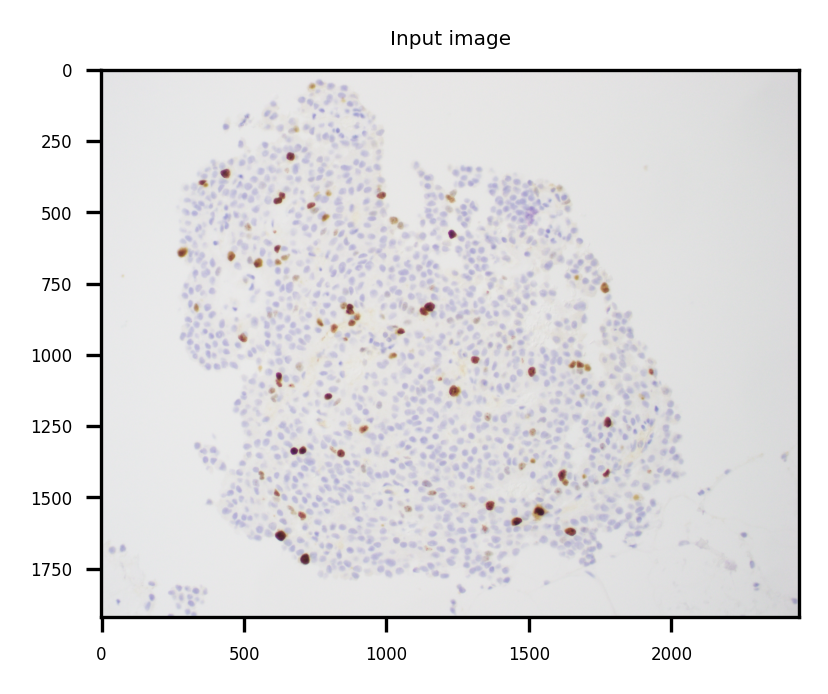

In [5]:
path = "/content/Screen Shot 2022-04-18 at 11.50.38 PM.png"

expected_image_size = (1920,2448,3)

image = cv2.imread(path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

if np.shape(image) != expected_image_size:
    image = cv2.resize (image, (2448,1920), interpolation = cv2.INTER_AREA)
    print("WARNING: image resized to width/height ratio of 1.25")

matplotlib.rcParams.update({'font.size': 4})
plt.figure(figsize= (3,3))
plt.title("Input image")
plt.imshow(image)
plt.show()

# Autocorrect Brightnes & Contrast

alpha 1.0714285714285714
beta 0.0


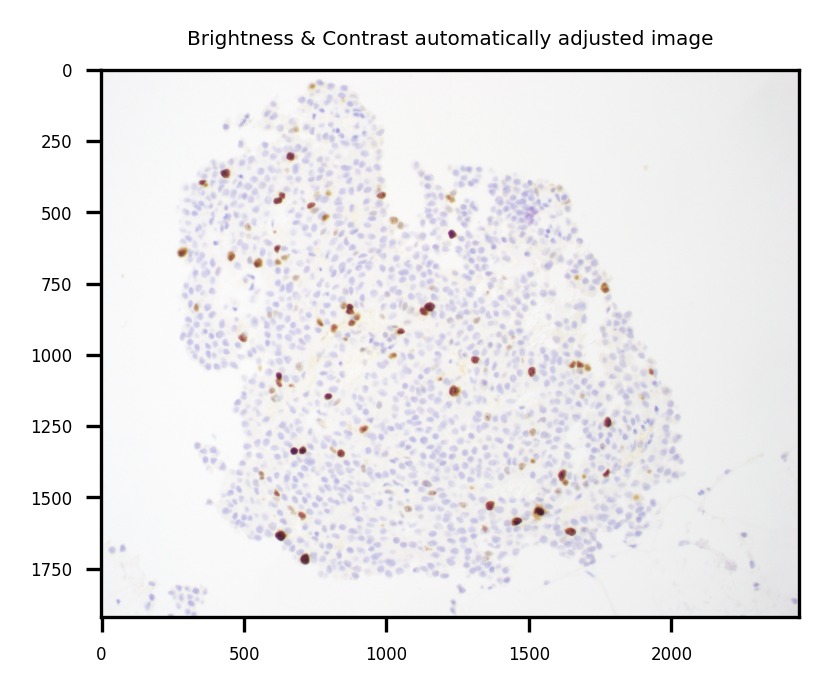

In [6]:
# https://stackoverflow.com/questions/56905592/automatic-contrast-and-brightness-adjustment-of-a-color-photo-of-a-sheet-of-pape/56909036
# Automatic brightness and contrast optimization with optional histogram clipping

def automatic_brightness_and_contrast(image, clip_hist_percent = 0):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Calculate grayscale histogram
    hist = cv2.calcHist([gray],[0],None,[256],[0,256])
    hist_size = len(hist)
    
    # Calculate cumulative distribution from the histogram
    accumulator = []
    accumulator.append(float(hist[0]))
    for index in range(1, hist_size):
        accumulator.append(accumulator[index -1] + float(hist[index]))
    
    # Locate points to clip
    maximum = accumulator[-1]
    clip_hist_percent *= (maximum/100.0)
    clip_hist_percent /= 2.0
    
    # Locate left cut
    minimum_gray = 0
    while accumulator[minimum_gray] < clip_hist_percent:
        minimum_gray += 1
    
    # Locate right cut
    maximum_gray = hist_size -1
    while accumulator[maximum_gray] >= (maximum - clip_hist_percent):
        maximum_gray -= 1
    
    # Calculate alpha and beta values
    alpha = 255 / (maximum_gray - minimum_gray)
    beta = -minimum_gray * alpha
    

    auto_result = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return (auto_result, alpha, beta)

matplotlib.rcParams.update({'font.size': 4})
image_auto_corrected, alpha, beta = automatic_brightness_and_contrast(image)
print('alpha', alpha)
print('beta', beta)
plt.figure(figsize=(3,3))
plt.title("Brightness & Contrast automatically adjusted image")
plt.imshow(image_auto_corrected)
plt.show()


#Separate colors in immunohistochemical staining¶
https://scikit-image.org/docs/dev/auto_examples/color_exposure/plot_ihc_color_separation.html

https://github.com/scikit-image/scikit-image/issues/5164

<Figure size 600x600 with 0 Axes>

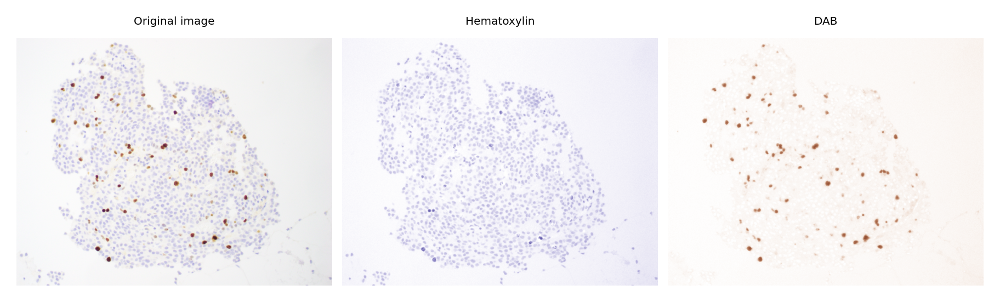

In [7]:
plt.figure(figsize= (2,2))

# Note that we have to convert to RGB b/c before this, I was making the conversion in the H&E normalization section, which I am not using here for DAB
from skimage import color
from skimage import io


import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from skimage.color import rgb2hed, hed2rgb

# Separate the stains from the IHC image

ihc_hed = rgb2hed(image_auto_corrected)

# Create an RGB image for each of the stains
null = np.zeros_like(ihc_hed[:, :, 0])
ihc_h = hed2rgb(np.stack((ihc_hed[:, :, 0], null, null), axis=-1))
ihc_e = hed2rgb(np.stack((null, ihc_hed[:, :, 1], null), axis=-1))
ihc_d = hed2rgb(np.stack((null, null, ihc_hed[:, :, 2]), axis=-1))

# Display
fig, axes = plt.subplots(1, 3, figsize=(6,6), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image_auto_corrected)
ax[0].set_title("Original image")

ax[1].imshow(ihc_h)
ax[1].set_title("Hematoxylin")

# ax[2].imshow(ihc_e)
# ax[2].set_title("Eosin") 

ax[2].imshow(ihc_d)
ax[2].set_title("DAB")

for a in ax.ravel():
    a.axis('off')

fig.tight_layout()

# Counting Total cells (using original image, non-deconvulved image)

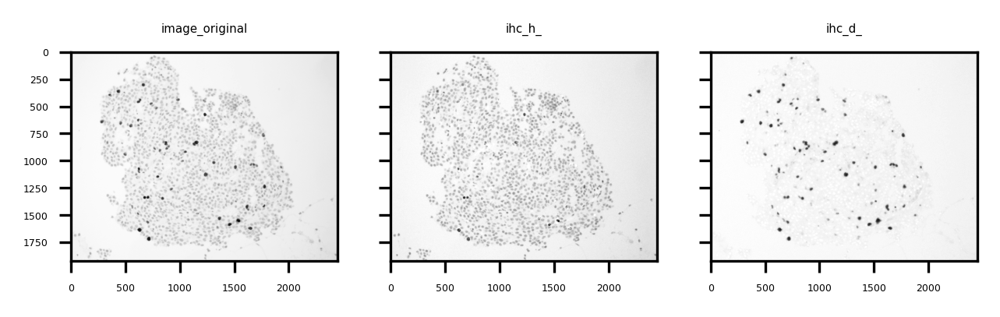

In [8]:
image_original = cv2.cvtColor(image_auto_corrected.astype(np.uint8), cv2.COLOR_RGB2GRAY) 

ihc_h_ = (ihc_h * 255).astype(np.uint8)
image_ihc_h_ = cv2.cvtColor(ihc_h_.astype(np.uint8), cv2.COLOR_RGB2GRAY) 

ihc_d_ = (ihc_d * 255).astype(np.uint8)
image_ihc_d_ = cv2.cvtColor(ihc_d_.astype(np.uint8), cv2.COLOR_RGB2GRAY) 



matplotlib.rcParams.update({'font.size': 3})
fig, axes = plt.subplots(1,3, figsize=(5,5), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image_original, cmap = 'gray')
ax[0].set_title("image_original")

ax[1].imshow(image_ihc_h_, cmap = 'gray')
ax[1].set_title("ihc_h_")

ax[2].imshow(image_ihc_d_, cmap = 'gray')
ax[2].set_title("ihc_d_")

plt.show()

# Correcting/Normalizing Brightness and contrast

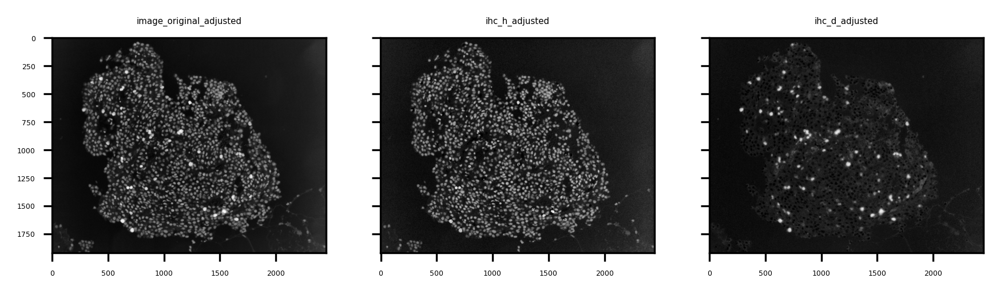

In [9]:
# IHC_D
image_ihc_d_inv = cv2.bitwise_not(image_ihc_d_)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
image_ihc_d_inv_clahe = clahe.apply(image_ihc_d_inv)

# IHC_H
image_ihc_h_inv = cv2.bitwise_not(image_ihc_h_)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
image_ihc_h_inv_clahe = clahe.apply(image_ihc_h_inv)


# Original_image
image_original_inv  = cv2.bitwise_not(image_original)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
image_original_inv_clahe = clahe.apply(image_original_inv)



matplotlib.rcParams.update({'font.size': 3})
fig, axes = plt.subplots(1,3, figsize=(7,7), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image_original_inv_clahe, cmap = 'gray')
ax[0].set_title("image_original_adjusted")

ax[1].imshow(image_ihc_h_inv_clahe, cmap = 'gray')
ax[1].set_title("ihc_h_adjusted")

ax[2].imshow(image_ihc_d_inv_clahe, cmap = 'gray')
ax[2].set_title("ihc_d_adjusted")

plt.show()

# reduce the intensity of the Ki67+ cell pixels so it doesn't interfere with segmentation

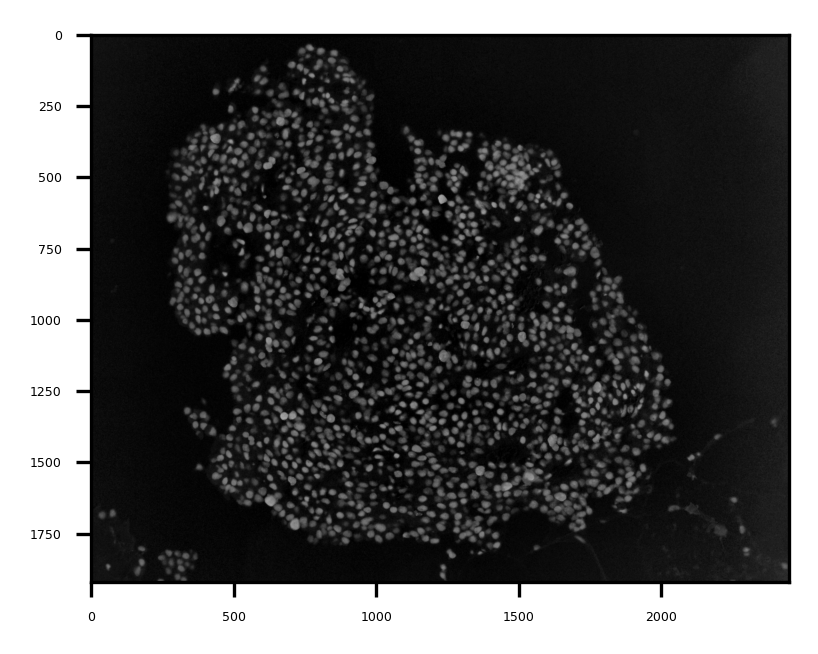

In [10]:
# Substract the DAB channel (50% of it) from the original image to reduce the intensity of Ki67+ cells
# Bright Ki67+ cells confuse Cellpose segmentation as they are substaintly brighter than all other cells
# Substrating half the DAB channel brings the intensity of all cells roughly to the same level and improves cellpose segmentation

H_E_overlay = image_original_inv_clahe - (image_ihc_d_inv_clahe*0.5)
H_E_overlay = np.where(H_E_overlay <1, 0, H_E_overlay)      # If the substraction leads to negative pixel values, bring them up to "zero"


plt.figure(figsize=(3,3))
plt.imshow(H_E_overlay, cmap = 'gray', vmin = 0, vmax = 255)    # setting vmin and vmax on matplotlib allows visuaizaiton ACTUAL pixel values
plt.show()

# Apply cellpose on the **modified original image** to best identify positive cells

2022-04-19 06:51:59,047 [INFO] ** TORCH CUDA version installed and working. **
2022-04-19 06:51:59,049 [INFO] >>>> using GPU
2022-04-19 06:51:59,160 [INFO] ~~~ ESTIMATING CELL DIAMETER(S) ~~~
2022-04-19 06:52:05,111 [INFO] estimated cell diameter(s) in 5.95 sec
2022-04-19 06:52:05,113 [INFO] >>> diameter(s) = 
2022-04-19 06:52:05,114 [INFO] [ 22.90 ]
2022-04-19 06:52:05,115 [INFO] ~~~ FINDING MASKS ~~~


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4004: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "


2022-04-19 06:52:12,969 [INFO] >>>> TOTAL TIME 13.81 sec


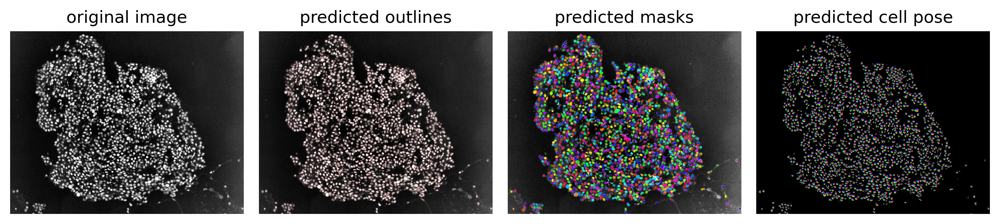

In [11]:
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300
from cellpose import utils, io


#!pip install cellpose

from cellpose import models, io

# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu= True, model_type='nuclei')

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus


masks_original_image, flows_original_image, styles, diams_original_image = model.eval(H_E_overlay, diameter= None, channels = channels)
#masks_original_image, flows_original_image, styles, diams_original_image = model.eval(image_ihc_d_inv_clahe, diameter= None, channels = channels)

# DISPLAY RESULTS
from cellpose import plot


fig = plt.figure(figsize=(10,5))
plot.show_segmentation(fig, H_E_overlay, masks_original_image, flows_original_image[0], channels=channels)
plt.tight_layout()
plt.show()

In [12]:
# after cleaning the mask, the "pixel value" of each object in the cleaned mask is no longer the true number of cells. We will need to recount the numbner of cells
values = np.unique(masks_original_image)

print("total cell count:", len(values))

total cell count: 1763


## Using scikit image measure.prop to measure some morphological features on each cell, such as area, solidity, etc.

In [13]:
from skimage.measure import label, regionprops, regionprops_table
from skimage import measure
from skimage import measure, img_as_ubyte
from skimage.color import label2rgb, rgb2gray
from skimage.segmentation import clear_border

def predict_generate_cell_properties(input_cell_mask, input_image):    
    # Label each region/cell 
    masks = skimage.measure.label(input_cell_mask, background= 0, return_num= False, connectivity = 2)

    # Get properties of each region/cell
    cell_props = regionprops_table((masks), input_image, properties= ['label','area','bbox', 'label', 'solidity', 'convex_area', 'perimeter', 'area', 'minor_axis_length', 'major_axis_length', 'centroid', 'mean_intensity'])
    df = pd.DataFrame(cell_props)
    df.tail()

    return df

# Eliminate cells sitting on the border using Scikit image

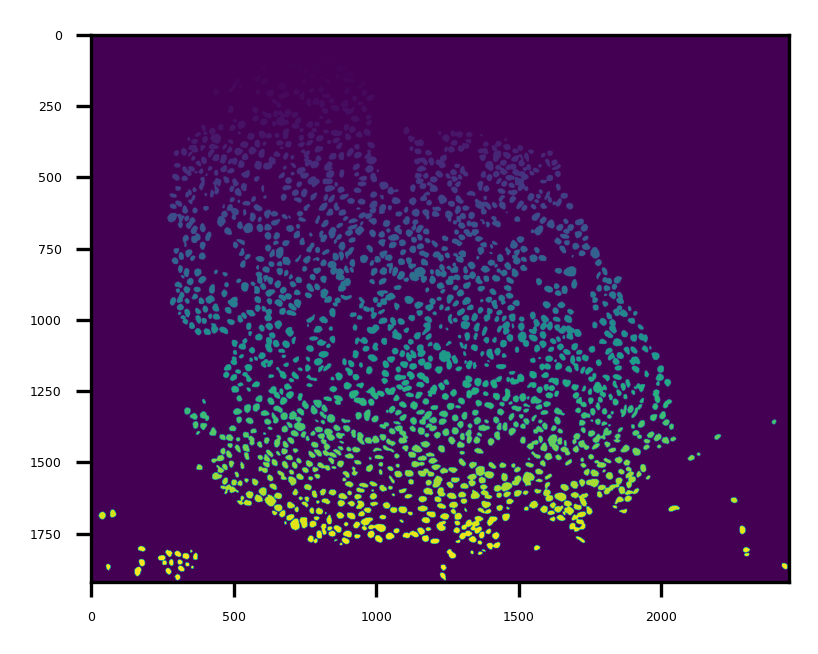

In [14]:
from skimage.segmentation import clear_border

masks_original_image_cleared = clear_border(masks_original_image)


matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize=(3,3))
plt.imshow(masks_original_image_cleared)
plt.show()

In [15]:
print("total cell count = ", np.max(masks_original_image_cleared))

total cell count =  1759


In [16]:
from skimage import measure, io, img_as_ubyte
from skimage.color import label2rgb, rgb2gray

image_original_inv_clahe = img_as_ubyte(image_original_inv_clahe.astype(np.uint8))
df_original = predict_generate_cell_properties(masks_original_image_cleared, image_original_inv_clahe)
df_original = df_original.drop(labels = ['label'], axis =1)


In [17]:
index_original = df_original.index
number_of_rows = len(index_original)
print("Number of elements in the original image dataframe: ", number_of_rows)


Number of elements in the original image dataframe:  1759


In [18]:
df_original.tail()

,area,bbox-0,bbox-1,bbox-2,bbox-3,solidity,convex_area,perimeter,minor_axis_length,major_axis_length,centroid-0,centroid-1,mean_intensity
1754,79,1863,351,1873,360,0.975309,81,30.485281,9.750607,10.395057,1867.670886,355.177215,52.025316
1755,586,1867,153,1900,177,0.946688,619,95.355339,22.621951,33.325592,1881.923208,163.834471,71.970990
1756,346,1871,262,1894,282,0.950549,364,70.870058,18.222088,24.291887,1881.595376,271.294798,59.710983
1757,374,1887,1224,1914,1245,0.928040,403,80.870058,16.412750,29.777998,1898.614973,1234.489305,95.237968
1758,302,1892,294,1914,313,0.932099,324,68.627417,18.372200,21.176768,1902.433775,303.486755,73.523179


# Filtering

In [19]:
# Eliminating Spindle Cells (Major axis 3x bigger than minor axis)
df_original = df_original.drop(df_original[(df_original['major_axis_length']/ df_original['minor_axis_length']) > 4].index)

# Eliminating possible Lymphocytes (cutoff point = mean area of all cells / 2.5)
df_original = df_original.drop(df_original[df_original.area  < df_original['area'].mean()/2.5].index)

# Eliminating outlier small/large "objects"
# df_original = df_original.drop(df_original[df_original.area  < df_original.area.quantile(q = 0.001)].index) # Cell size
# df_original = df_original.drop(df_original[df_original.area  > df_original.area.quantile(q = 0.999)].index) # Cell size


In [20]:
index_original = df_original.index
number_of_rows = len(index_original)
print("Number of elements in the original image dataframe AFTER FILTERING: ", number_of_rows)



Number of elements in the original image dataframe AFTER FILTERING:  1637


In [21]:
df_original.reset_index(drop = True, inplace = True)


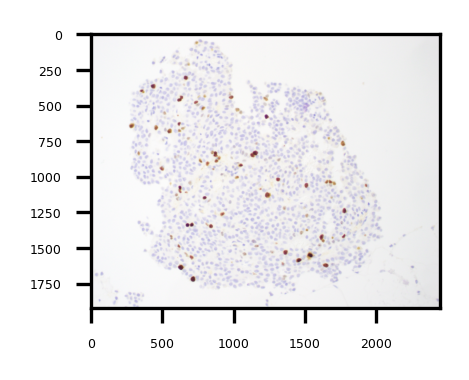

In [22]:
image_corrected_copy = np.copy(image_auto_corrected)
image_corrected_copy_circles = np.copy(image_auto_corrected)

plt.figure(figsize = (1.5, 1.5))
plt.imshow(image_auto_corrected)
plt.show()



# Function to calcute "brownness" or "positive staining" of each cell
## quantifies the intensity of image on the single DAB channel obtained from the scikit image DAB deconvulving function

In [23]:
def DAB_intensity(image, mask):

    # ensure mask is 0 (background) and 1(foreground) values
    mask = np.where(mask > 1, 1, mask)

    mask_x_image_R = image[:,:,0] * mask
    mask_x_image_G = image[:,:,1] * mask
    mask_x_image_B = image[:,:,2] * mask
    mask_x_image = cv2.merge((mask_x_image_R, mask_x_image_G, mask_x_image_B))
    mask_x_image = np.where(mask_x_image == 0, 255, mask_x_image)

    mask_x_image = mask_x_image.astype(np.uint8)
    mask_x_image_gray = cv2.cvtColor(mask_x_image, cv2.COLOR_RGB2GRAY) 
    mask_x_image_gray_flat = np.ndarray.flatten(mask_x_image_gray)
    mask_x_image_gray_flat_negative = 255 - mask_x_image_gray_flat

    cell_area = len(mask_x_image_gray_flat[mask_x_image_gray_flat<255])
    
    # Total box area - AUC (brightness curve) = AUC for dark pixels
    DAB_index_AUC = np.sum(mask_x_image_gray_flat_negative)
    DAB_index_AUC_norm =  DAB_index_AUC / cell_area
    

    return DAB_index_AUC_norm /255  # to get output in 0-1 range

In [24]:
DAB_index = []
cell_images_dataset = np.zeros((len(df_original),25,25,3))
j = 0

proposed_stain_threshold = 0.10

for i in range(len(df_original)):

    # Crop out each cell from the main image using its bounding box coordinates
    ihc_normalized = (ihc_d * 255).astype(np.uint8) # normalize the original DAB stain image of the big input image
    cell_image_auto_corrected = image_auto_corrected[df_original.loc[i, 'bbox-0']: df_original.loc[i, 'bbox-2'], df_original.loc[i, 'bbox-1']: df_original.loc[i, 'bbox-3']]
    
    # Crop out each cell image and mask
    cell_image = ihc_normalized[df_original.loc[i, 'bbox-0']: df_original.loc[i, 'bbox-2'], df_original.loc[i, 'bbox-1']: df_original.loc[i, 'bbox-3']]
    
    mask_label = masks_original_image_cleared[int(df_original.loc[i, 'centroid-0']), int(df_original.loc[i, 'centroid-1'])]
    mask_image = masks_original_image_cleared[df_original.loc[i, 'bbox-0']: df_original.loc[i, 'bbox-2'], df_original.loc[i, 'bbox-1']: df_original.loc[i, 'bbox-3']]
    mask_image = np.where((mask_image != 0) & (mask_image != mask_label), 0, mask_image)  # eliminate mask of adjacent cell from the bounding box


    if cell_image.shape[0] > 0 and cell_image.shape[1]> 0: 
        DAB_index = np.append(DAB_index, DAB_intensity(cell_image, mask_image))


    # # Single cell visualization  
    # if DAB_index[i] > proposed_stain_threshold:
    #     print("\n")
    #     print("DAB_index: ", DAB_index[i])
    #     plt.figure(figsize=(0.5,0.5))
    #     plt.imshow(cell_image)
    #     plt.show()

    #     mask_image = np.where(mask_image > 1, 1, mask_image)
    #     cell_image_auto_corrected_R = cell_image_auto_corrected[:,:,0] * mask_image
    #     cell_image_auto_corrected_G = cell_image_auto_corrected[:,:,1] * mask_image
    #     cell_image_auto_corrected_B = cell_image_auto_corrected[:,:,2] * mask_image
    #     cell_image_auto_corrected_x_image = cv2.merge((cell_image_auto_corrected_R, cell_image_auto_corrected_G, cell_image_auto_corrected_B))

    #     plt.figure(figsize=(0.5,0.5))
    #     plt.imshow(cell_image_auto_corrected_x_image)
    #     plt.show()
        

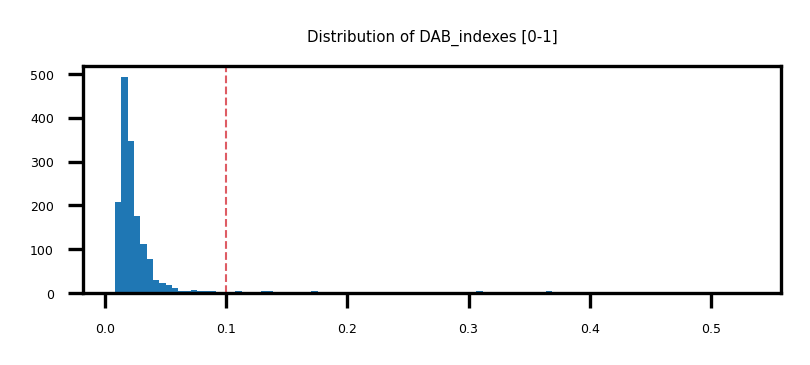

In [25]:
plt.figure(figsize=(3,1))
plt.title("Distribution of DAB_indexes [0-1]")
plt.axvline(x = proposed_stain_threshold, ls = "--", color='#d11723', alpha=0.7, linewidth= 0.5) # Standard deviation lines
plt.hist(DAB_index, bins = 100)
plt.show()

# the higher the DAB_index value, the darker and more intense the dark brown staining is.

In [26]:
# Copy df_ region props data into a new dataframe, to avoid messing up original data
df_cell_colors = df_original

# Add calculated brownness index to the "new" DF
df_cell_colors['DAB_index'] = pd.Series(DAB_index) 
df_cell_colors['DAB_index'] = df_cell_colors['DAB_index'].fillna(0)        # Replace Nan values with =0


In [27]:
df_cell_stained = df_cell_colors[df_cell_colors.DAB_index > proposed_stain_threshold]
df_cell_stained = df_cell_stained.reset_index()     # resent the index of stained cell's dataset into 0,1,2,3...

# round DAB_index values
df_cell_stained['DAB_index'] = df_cell_stained['DAB_index'].round(decimals = 3)
df_cell_stained.tail()

,index,area,bbox-0,bbox-1,bbox-2,bbox-3,solidity,convex_area,perimeter,minor_axis_length,major_axis_length,centroid-0,centroid-1,mean_intensity,DAB_index
111,1479,981,1607,1625,1638,1667,0.957073,1025,125.012193,29.372401,42.860217,1620.995923,1646.575943,175.784913,0.424
112,1486,1154,1613,609,1655,650,0.942810,1224,139.982756,35.890119,41.473884,1634.522530,628.710572,190.110052,0.419
113,1554,439,1689,1345,1708,1376,0.942060,466,84.284271,18.710944,30.070928,1697.760820,1359.685649,106.223235,0.132
114,1561,1050,1697,698,1739,733,0.951087,1104,130.083261,33.085669,41.115679,1717.943810,715.695238,189.635238,0.443
115,1566,416,1705,1337,1726,1363,0.928571,448,80.627417,19.553988,27.308425,1715.141827,1349.175481,99.228365,0.104


image name: /content/Screen Shot 2022-04-18 at 11.50.38 PM.png
Ki67+ cell count =  102
Total cell count =  1637
Ki67 labeling percentage counted as = 6.23%




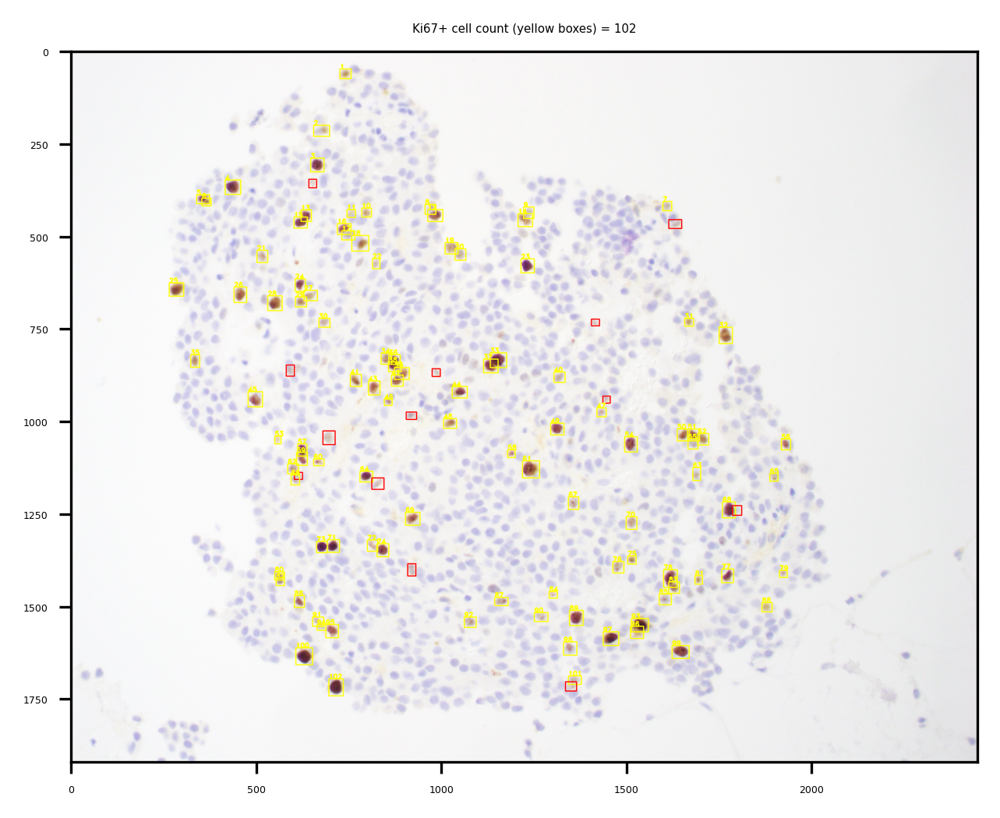

In [28]:
Ki67_pos_counted = len(df_cell_stained[df_cell_stained['DAB_index'] > (proposed_stain_threshold+ 0.03)])
Total_cell_counted = len(df_original)

Ki_67_percentage_counted = np.round(100* (Ki67_pos_counted/ Total_cell_counted), 2)

print("image name:", path)
print("Ki67+ cell count = ", Ki67_pos_counted)
print("Total cell count = ", Total_cell_counted)
print('Ki67 labeling percentage counted as = {}%'.format(Ki_67_percentage_counted))
print("\n")


# Print image with sqaures around Ki67+ cells
    # Yellow boxes for cells that are reliably Ki67+
    # Red boxes that have dimer Ki67+ staining or are too spindly

counter = 0
for i in range (len(df_cell_stained)):
    
    if df_cell_stained.loc[i, 'DAB_index'] > (proposed_stain_threshold + 0.03): 
        counter +=1
        cv2.rectangle(image_corrected_copy, (df_cell_stained.loc[i, 'bbox-1']-2, df_cell_stained.loc[i, 'bbox-0']-2), (df_cell_stained.loc[i, 'bbox-3']+2, df_cell_stained.loc[i, 'bbox-2']+2), (255,255,0), 2)
        cv2.putText(image_corrected_copy, str(counter), (df_cell_stained.loc[i, 'bbox-1']-2, df_cell_stained.loc[i, 'bbox-0']-2), fontFace = cv2.FONT_HERSHEY_DUPLEX, fontScale = 0.6, color = (255, 255, 0), thickness = 2)

    else:


        if df_cell_stained.loc[i, 'DAB_index'] < (proposed_stain_threshold + 0.03) and df_cell_stained.loc[i, 'DAB_index'] > (proposed_stain_threshold):
            cv2.rectangle(image_corrected_copy, (df_cell_stained.loc[i, 'bbox-1']-2, df_cell_stained.loc[i, 'bbox-0']-2), (df_cell_stained.loc[i, 'bbox-3']+2, df_cell_stained.loc[i, 'bbox-2']+2), (255,0,0), 2)

        if df_cell_stained.loc[i, 'major_axis_length'] / df_cell_stained.loc[i, 'minor_axis_length'] > 2.5:
            cv2.rectangle(image_corrected_copy, (df_cell_stained.loc[i, 'bbox-1']-2, df_cell_stained.loc[i, 'bbox-0']-2), (df_cell_stained.loc[i, 'bbox-3']+2, df_cell_stained.loc[i, 'bbox-2']+2), (255,0,0), 2)

        if df_cell_stained.loc[i, 'area'] < np.mean(df_original.area)/1.5:
            cv2.rectangle(image_corrected_copy, (df_cell_stained.loc[i, 'bbox-1']-2, df_cell_stained.loc[i, 'bbox-0']-2), (df_cell_stained.loc[i, 'bbox-3']+2, df_cell_stained.loc[i, 'bbox-2']+2), (255,0,0), 2)




plt.figure(figsize = (5,5))
plt.title("Ki67+ cell count (yellow boxes) = {}".format(Ki67_pos_counted))
plt.imshow(image_corrected_copy)
plt.savefig('/content/ki67.pdf')  
#plt.savefig('/content/drive/MyDrive/Final_Ki67_validation_data_March_2022/Results/'+ os.path.basename(path) +'_ki67.pdf')  
plt.show()  

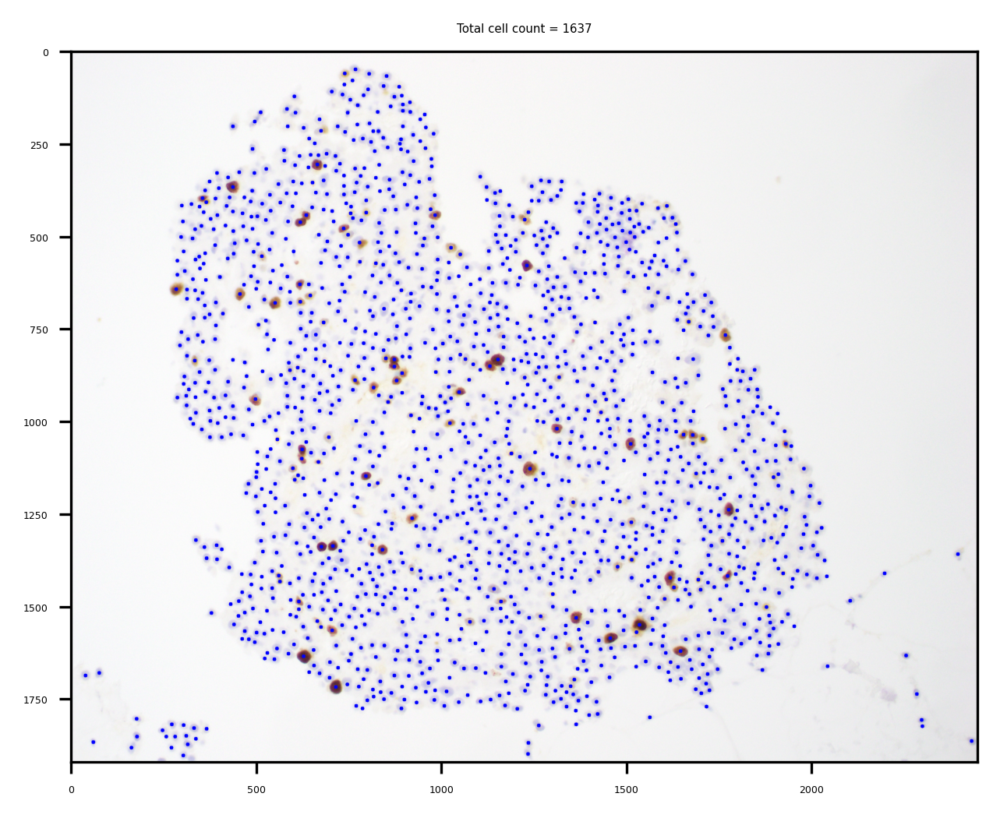

In [29]:
# image = cv2.circle(image, center_coordinates, radius, color, thickness)

for i in range(len(df_original)):
    cv2.circle(image_corrected_copy_circles, (int(df_original.loc[i, 'centroid-1']), int(df_original.loc[i, 'centroid-0'])), 5, (0,0,255), thickness= -1)

plt.figure(figsize = (5,5))
plt.title("Total cell count = {}".format(len(df_original)))
plt.imshow(image_corrected_copy_circles)
plt.savefig('/content/Total.pdf')  
#plt.savefig('/content/drive/MyDrive/Final_Ki67_validation_data_March_2022/Results/'+ os.path.basename(path) +'_Total.pdf') 
plt.show()  